# Linear Perceptron

In [1]:
import numpy as np
import glob
from helperP import *


### Define linear perceptron class

In [6]:
class PrimalPerceptron(object):
    def __init__(self, x, y, w=None, b=None):
        num_sample, num_dims = x.shape

        np.random.seed(0)
        ####################################
        # TODO: YOUR CODE HERE： init weights
        ####################################
        if not w:
            w = np.random.randn(num_dims, 1)
        if not b:
            b = np.random.randn(1, 1)

        self.x, self.y, self.w, self.b = x, y, w, b
        self.lr = 0.1

        self.y_hat = None
        self.predict()

    def predict(self):
        ####################################
        # TODO: YOUR CODE HERE, forward
        ####################################
        num_sample, num_dims = self.x.shape
        preds = np.zeros([num_sample, 1])

        for i in range(num_sample):
            tmp = self.x[i].reshape(1,-1)
            preds[i,0] = tmp.dot(self.w)+self.b

        self.y_hat = self.sign(preds)
        return preds, self.y_hat

    def update(self):
        ####################################
        # TODO: YOUR CODE HERE, backward
        ####################################
        # update the weights and bias

        w_index = (self.y*self.y_hat < 0)  # wrong sample bool index
        for i in range(w_index.size):
            if not w_index[i,0]:
                a=self.y[i,0]
                b=self.x[i,:].reshape(1,-1).T

                self.w -= self.lr * a * b
                self.b -= self.lr * a
        
        return

    def sign(self,v):
        v[v > 0] = 1
        v[v <= 0] = -1
        return v

### Train linear perceptron

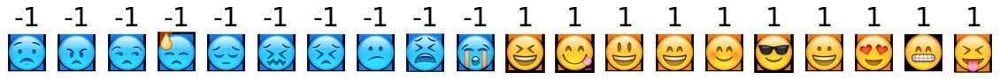

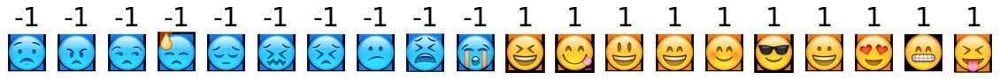

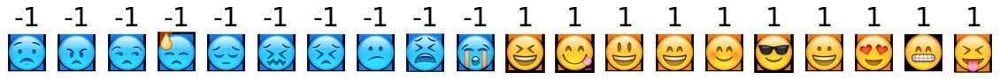

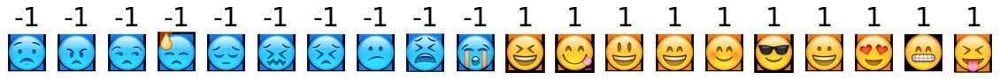

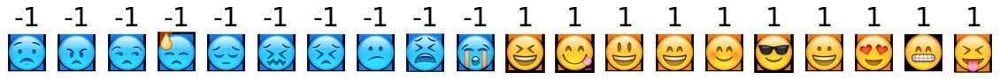

...

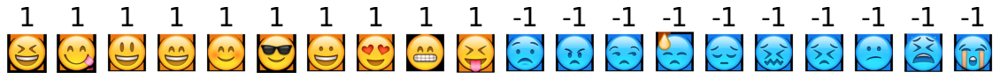

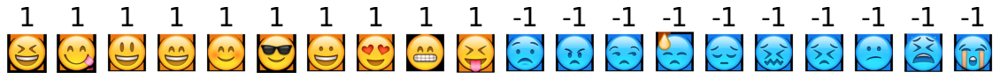

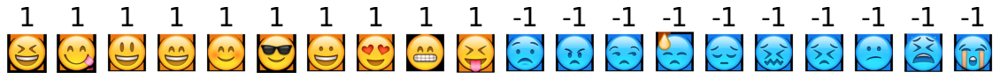

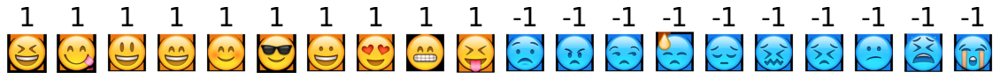

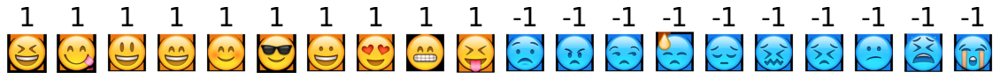

In [8]:
if __name__ == '__main__':
    # Load data
    file_names = glob.glob('DATASET/data_emoji/*/*.*')
    # np.random.shuffle(file_names)
    # print(file_names)

    reduced, images, labels = load_image(file_names)
    
    reduced = reduced.reshape(reduced.shape[0], -1)
    # Instantiate Perceptron
    p = PrimalPerceptron(reduced, labels)
    # Iterate over data and update
    
    plt.rcParams["figure.figsize"] = [20, 20]  
    for i in range(100): 
        p.update()
        preds, y_hat = p.predict()
        visualize_results(images, preds, labels, None)
